# Advanced Lane-Line
The following notebook contains sample imagery, descriptions, and simple templated sources. It cannot stand without the accompanying sources in this repository.

In [2]:
import os
import matplotlib
from scipy import misc
from moviepy.editor import VideoFileClip

%matplotlib inline

%run util.py
%run viz.py

print("Loaded external sources.")

Loaded external sources.


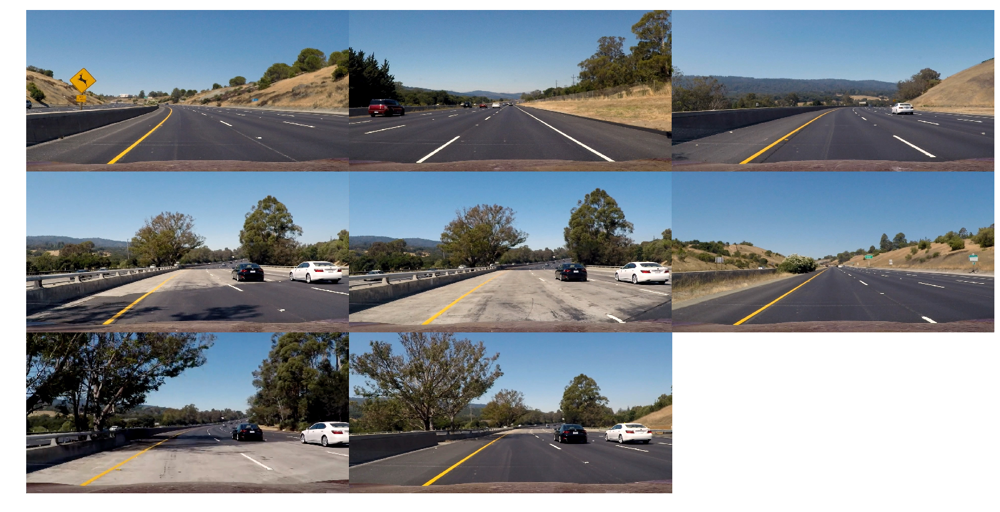

In [3]:
# The test images are loaded into memory (there is sufficient memory).
test_images = [misc.imread(image_path) for image_path in abswalk('./test_images')]

# A view of the original test images.

figure_1 = mosaic(test_images, 10, 20, 3)
figure_1.show()


## Camera calibration
Relevant sources are in `calibrator.py`.

N/A% (0 of N/A) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

Preparing calibrator.


100% (20 of 20) |#########################| Elapsed Time: 0:01:11 Time: 0:01:11


Calibrator prepared.


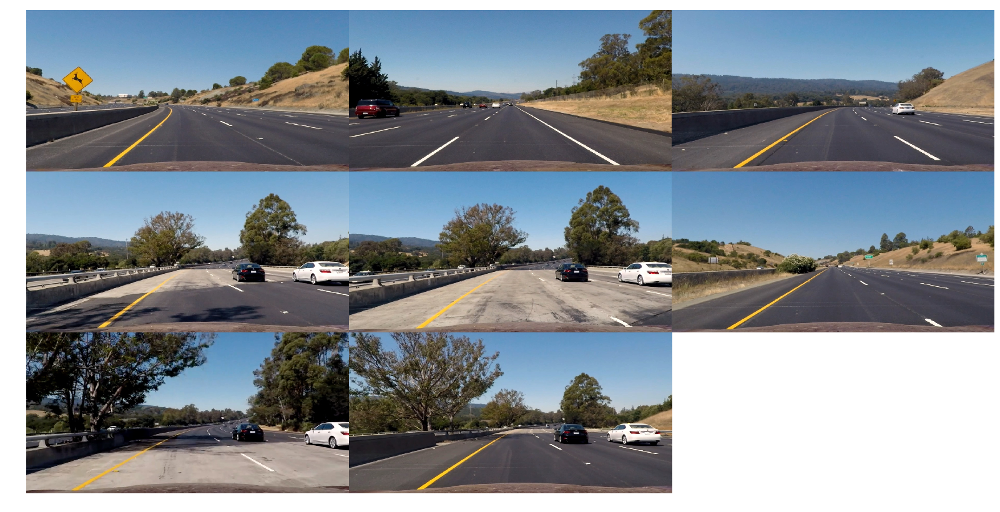

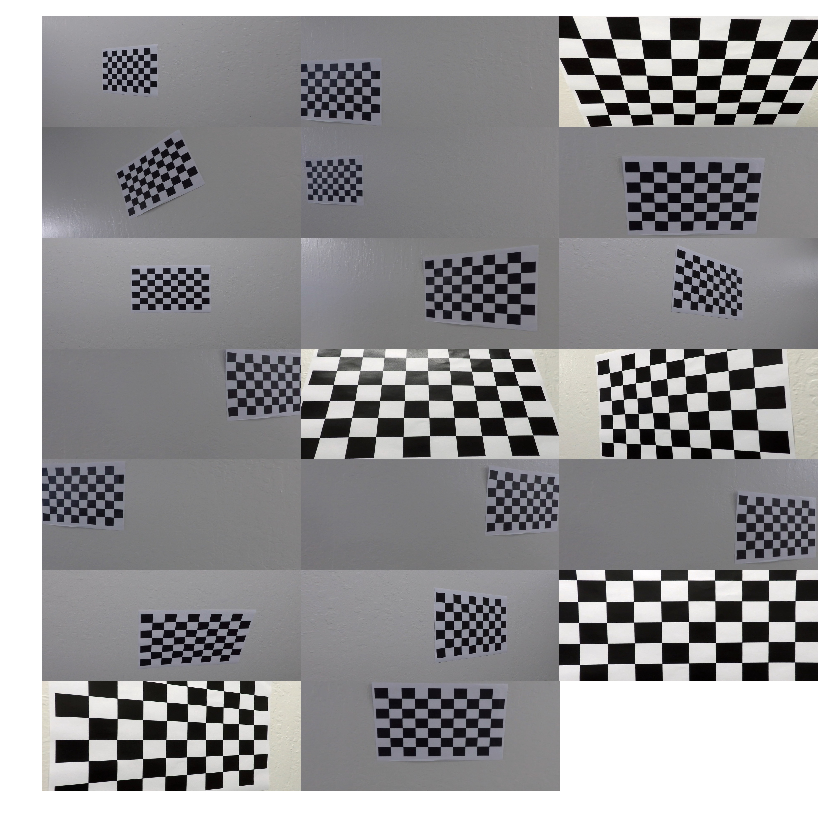

In [4]:
%run calibrator.py

calibration_image_paths = abswalk('camera_cal')
calibration_images = [misc.imread(image_path) for image_path in calibration_image_paths]

# See calibrator.py for details of this class.
print("Preparing calibrator.")
cal = Calibrator((9,6), calibration_image_paths)
print("Calibrator prepared.")

calibrated_test_images = [cal.undistort(image) for image in test_images]

figure_2 = mosaic(calibrated_test_images, 10, 20, 3)
figure_2.show()

calibrated_cal_images = [cal.undistort(image) for image in calibration_images]

figure_3 = mosaic(calibrated_cal_images, 10, 10, 3)
figure_3.show()


## Perspective alteration
Relevant sources are in `perspectifier.py`. The source and image points are selected from the image
`straight_lines1.jpg`

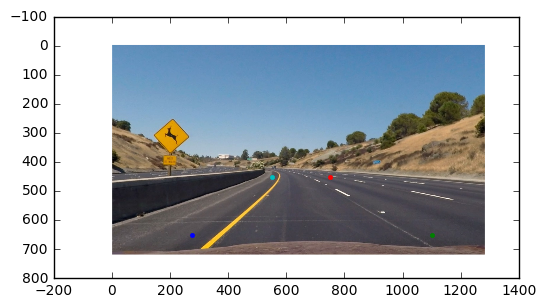

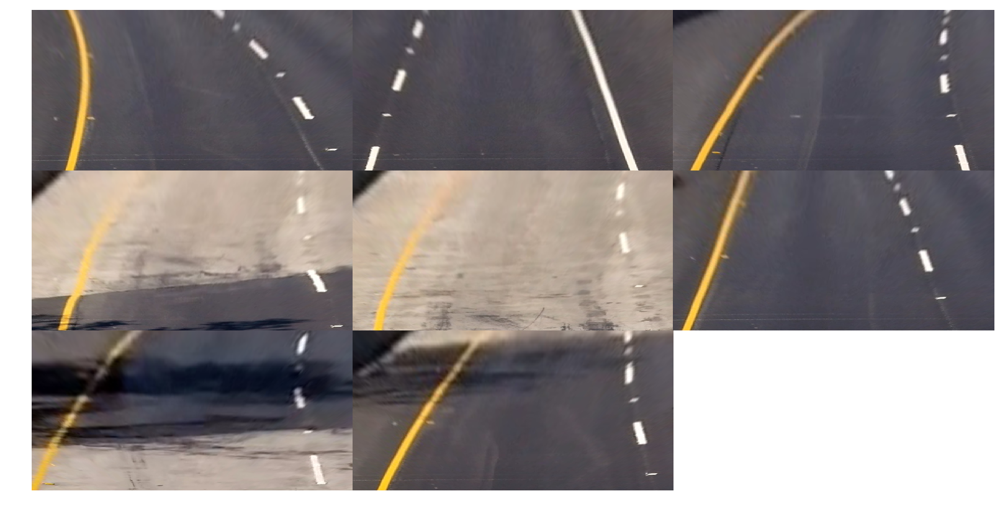

In [5]:
%run perspectifier.py

image_shape = test_images[0].shape

source_points = np.array([[275, 650], [1100,650], [750, 450], [550, 450]], np.float32)
destination_points = np.array([[0, image_shape[1]],
                                [image_shape[0], image_shape[1]],
                                [image_shape[0], 0], 
                                [0, 0]], np.float32)
plt.imshow(calibrated_test_images[0])
for point in source_points:
    plt.plot(point[0], point[1], '.')

    # See perspectifier.py for details of this class
per = Perspectifier(source_points = source_points, destination_points = destination_points)

per_test_images = [per.perspectify(image) for image in calibrated_test_images]
figure_4 = mosaic(per_test_images, 10, 20, 3)
figure_4.show()

## Further pre-processing 
Aside from the above transforms, the images on which lane lines are to be detected are pre-processed as follows: 

- Contrast Limited Adaptive Histogram Equalization (CLAHE) 
- Guassian normalization 
- Conversion to Grayscale 
    - Sobel (x) 
    - Sobel (y) 
- Conversion to HLS color space 
    - Extraction of only the S channel 

The procedure returns three images corresponding, respectively, to the gradient in the x direction , the gradient in the y direction, and the S-channel of the input color image. CLAHE is applied prior to the two following steps, which are performed on the same input.  

Further details are in the `preprocess.py` module.

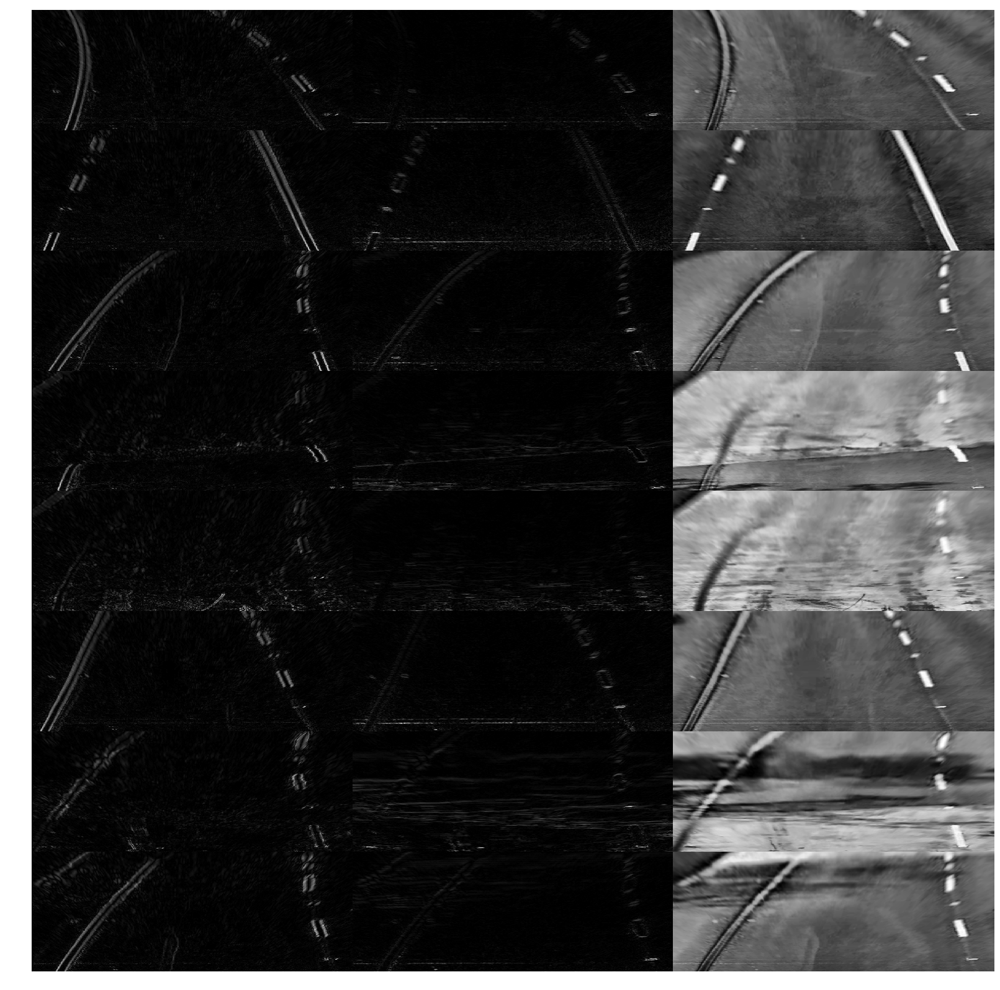

In [6]:
%run preprocess.py

proc_test_images = [preproc(image) for image in per_test_images]

plot_proc_test_images = [image for image_set in proc_test_images for image in image_set]
figure_5 = mosaic(plot_proc_test_images, 20, 20, 3, cmap='gray')
figure_5.show()


** Figure 5** Above, each row pertains to a separate test image. The columns, from left to right, contain (1) The scaled, absolute value of the gradient in the x direction, (2) The scaled, absolute value of the gradient in the y directon, and (3) The S-channel of test image. CLAHE is applied before the computation of (1), (2), and (3). 

## Thresholding 

With the above images as starting points, hresholds are applied to the gradient magnitudes, the gradient direction, and the image the s-channel, to expose the lane lines as clearly as possible. This is the final step prior to the application of the detection procedure. 

Thresholding is controlled by simple helper sources in `threshold.py`. 

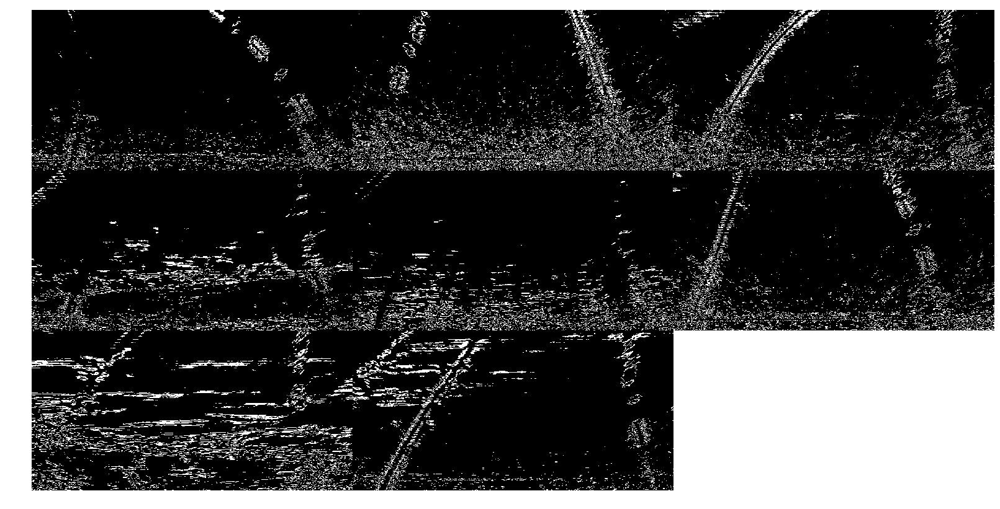

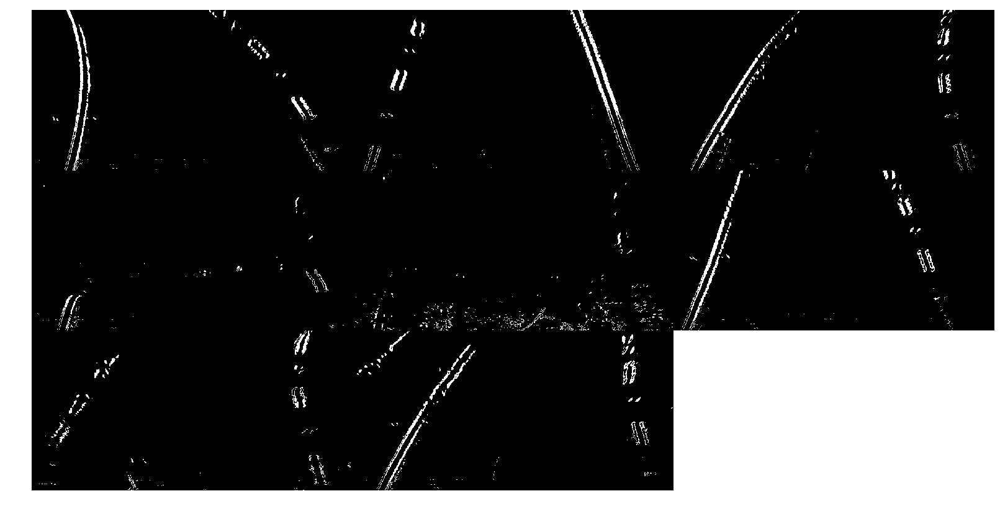

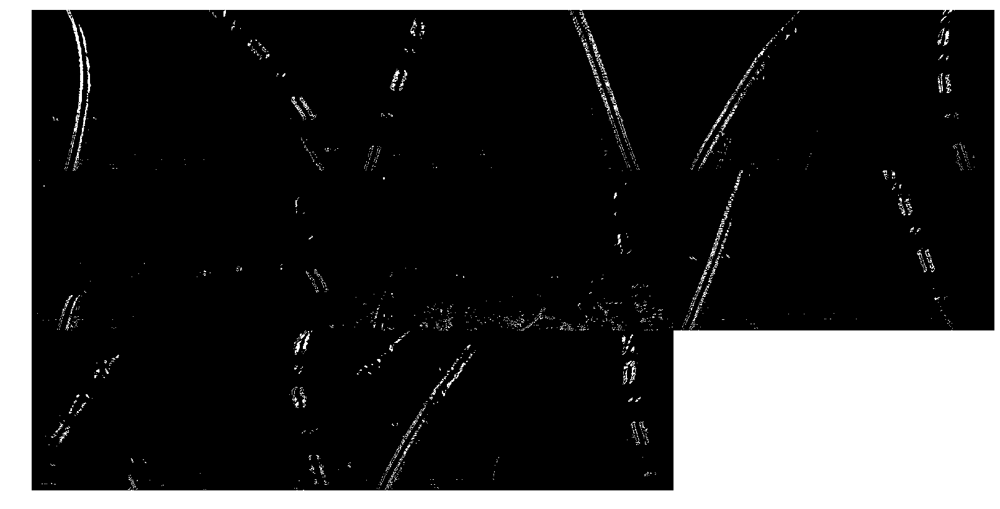

In [33]:
# Compute the magnitude and direction of the test iamge gradients.
%run treshold.py
import numpy as np

test_image_s    = [s for _, s, _ in proc_test_images]
test_image_dx   = [sx for sx, _, _, in proc_test_images]
test_image_dy   = [sy for _, sy, _, in proc_test_images]
#test_image_ddir = [grad_dir(sx, sy) for sx, sy,_ in proc_test_images]

s    = [bithreshold(image, 10, 20, '>', '<=') for image in test_image_s]
dx   = [bithreshold(image, 50, 100, '>=', '<=') for image in test_image_dx]
dy   = [bithreshold(image, 50, 100, '>=', '<=') for image in test_image_dy]
#ddir = [bithreshold(image, 0.8, 1.5, '>=', '<=') for image in test_image_ddir]

mosaic(s, 10, 20, 3, cmap='gray').show()
#mosaic(dx, 10, 20, 3, cmap='gray').show()
#mosaic(dy, 10, 20, 3, cmap='gray').show()
#mosaic(ddir, 10, 20, 3, cmap='gray').show()

f1 = np.array([dxi | dyi for dxi, dyi in zip(dx, dy)], dtype=np.uint8)
f2 = np.array([f1i & dxi for f1i, dxi in zip(dx, f1)], dtype=np.uint8)
f3 = np.array([f2i & (~ li) for f2i, li in zip(f2, s)], dtype=np.uint8)
mosaic(f2, 10, 20, 3, cmap='gray').show()
mosaic(f3, 10, 20, 3, cmap='gray').show()

The approach taken here, as illustrated above, is to take a combination of a number of available images. The 

## Lane Line Detection 

Sources relevant to what follows are contained in `line.py`, which defines the parameters required to identify a lane line, and `laneomatic.py` which defines the detection pipeline based on sliding windows. 